**MILESTONE 2 PHASE 2**

---

# **`ALDANDI FITRA RAMADHAN HCK - 004`**

---

*DATASETS* : https://www.kaggle.com/datasets/jorgebuenoperez/datacleaningglassesnoglasses

--`background`

An Indonesian company wants to provide glasses for all of its employees who wear glasses. However, the company has a lot of employees, so it requires a scientist to calculate the number of employees who wear glasses.

***Problem Statement***

* Classifying whether employees wear glasses or not by using European people's face data.

# `Import Library`

In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder, OrdinalEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import classification_report, roc_auc_score, ConfusionMatrixDisplay
from sklearn.feature_selection import SelectKBest, f_classif, RFE
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from feature_engine.outliers import Winsorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import chi2
from sklearn.model_selection import StratifiedKFold
from phik import phik_matrix
from sklearn.metrics import f1_score, make_scorer,roc_curve, auc
import joblib
from sklearn.linear_model import LogisticRegression
from PIL import Image
from IPython.display import display


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
import keras_preprocessing
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator
from collections import Counter
import warnings
import glob
import os
# os.environ["CUDA_VISIBLE_DEVICES"] = ' 1'

# # Now TensorFlow will only see the second GPU
# Ignore all warnings
warnings.simplefilter("ignore")

In [3]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [4]:
print('GPU: {}'.format(len(tf.config.list_physical_devices('GPU'))))

GPU: 1


# **`DATA LOADING`**

In [5]:
# path to file
data_dir= "Images\Images"
splitted_dir = 'splitted'
os.listdir(splitted_dir)

['test', 'train', 'val']

In [6]:
# loading all data from directory
class_names = ['no_glasses', 'glasses']
data = tf.keras.preprocessing.image_dataset_from_directory(data_dir, class_names=class_names)

Found 4920 files belonging to 2 classes.


In [7]:
# import train val test data path
train_dir = os.path.join(splitted_dir, 'train')
test_dir = os.path.join(splitted_dir, 'test')
val_dir = os.path.join(splitted_dir, 'val')

In [8]:
BATCH_SIZE = 32
IMG_SIZE = (160, 160)
# loading train val test dataset
train_set = tf.keras.preprocessing.image_dataset_from_directory(train_dir, class_names=class_names,
    image_size= IMG_SIZE,
    batch_size=BATCH_SIZE)
test_set = tf.keras.preprocessing.image_dataset_from_directory(test_dir, class_names=class_names)
val_set = tf.keras.preprocessing.image_dataset_from_directory(val_dir, class_names=class_names,
    image_size= IMG_SIZE,
    batch_size=BATCH_SIZE)

Found 3443 files belonging to 2 classes.
Found 494 files belonging to 2 classes.
Found 983 files belonging to 2 classes.


## `OVERVIEW`

In [9]:
# display len of train val test dataset
def check_len(dir=None, labels=None):
    for label in labels:
        tot_data= len(os.listdir(os.path.join(dir,label)))
        print(f'Total Data {label} : {tot_data}')

print('train set :')
check_len(train_dir, class_names)
print('\nval set :')
check_len(val_dir, class_names)
print('\ntest set :')
check_len(test_dir, class_names)


train set :
Total Data no_glasses : 1505
Total Data glasses : 1938

val set :
Total Data no_glasses : 430
Total Data glasses : 553

test set :
Total Data no_glasses : 216
Total Data glasses : 278


EXAMPLES BOTH CLASSES :


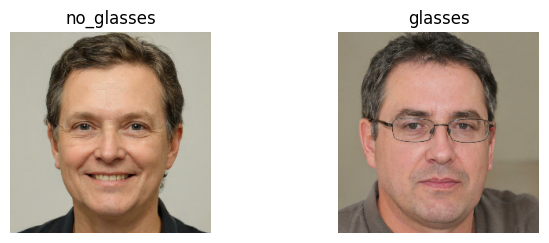

In [10]:
# display example of two classes
class_names = data.class_names
print('EXAMPLES BOTH CLASSES :')
# Create a dictionary to store the first image for each unique class
class_images = {}

for images, labels in data:
    for image, label in zip(images, labels):
        class_name = class_names[label]
        # If the class_name has not been added to the dictionary yet, add it with the current image
        if class_name not in class_images:
            class_images[class_name] = image.numpy().astype("uint8")
            break  # break out of the inner loop to move on to the next class
    # If we have an image for every unique class, break out of the outer loop
    if len(class_images) == len(class_names):
        break

# Visualize the first image for each unique class
plt.figure(figsize=(12, 12))
for i, class_name in enumerate(class_images.keys()):
    ax = plt.subplot(4, 3, i + 1)
    plt.imshow(class_images[class_name])
    plt.title(class_name)
    plt.axis("off")

`There's two classes for this dataset such as glasses or no glasses european people.`

# ***`EXPLORATORY DATA ANALYSIS`***

In [11]:
# class
class_names = train_set.class_names
class_indices = {class_name: index for index, class_name in enumerate(class_names)}
print(class_indices)

{'no_glasses': 0, 'glasses': 1}


In [12]:
# dimension of the images
iterator = iter(train_set)
images, labels = next(iterator)
print(images.shape)

(32, 160, 160, 3)


In [13]:
# display if there has a different shape
unique_shapes = []

for image, label in train_set:
    shape = image.shape
    if shape not in unique_shapes:
        unique_shapes.append(shape)

print("Unique image shapes in train_set:")
for shape in unique_shapes:
    print(shape)

Unique image shapes in train_set:
(32, 160, 160, 3)
(19, 160, 160, 3)


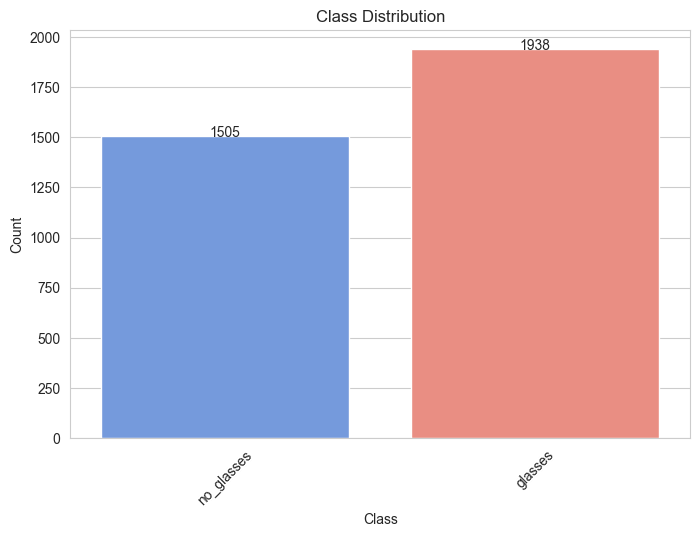

In [14]:
# barplot count each class
class_names = train_set.class_names
class_counts = {name: 0 for name in class_names}

for images, labels in train_set:
    for label in labels:
        class_name = class_names[label]
        class_counts[class_name] += 1

plt.figure(figsize=(8, 6))
plt.subplots_adjust(bottom=0.2)

sns.set_style("whitegrid")
colors = ['cornflowerblue', 'salmon']
ax = sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette=colors)

plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')

for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., height + 0.1, list(class_counts.values())[i], ha="center")

plt.xticks(rotation=45)

plt.show()

The dataset contains a total of 3443 images, with 1938 images belonging to the glasses class and 1505 images belonging to the no_glasses class. This means that approximately 56% of the images in the dataset belong to the glasses class and 44% belong to the no_glasses class.

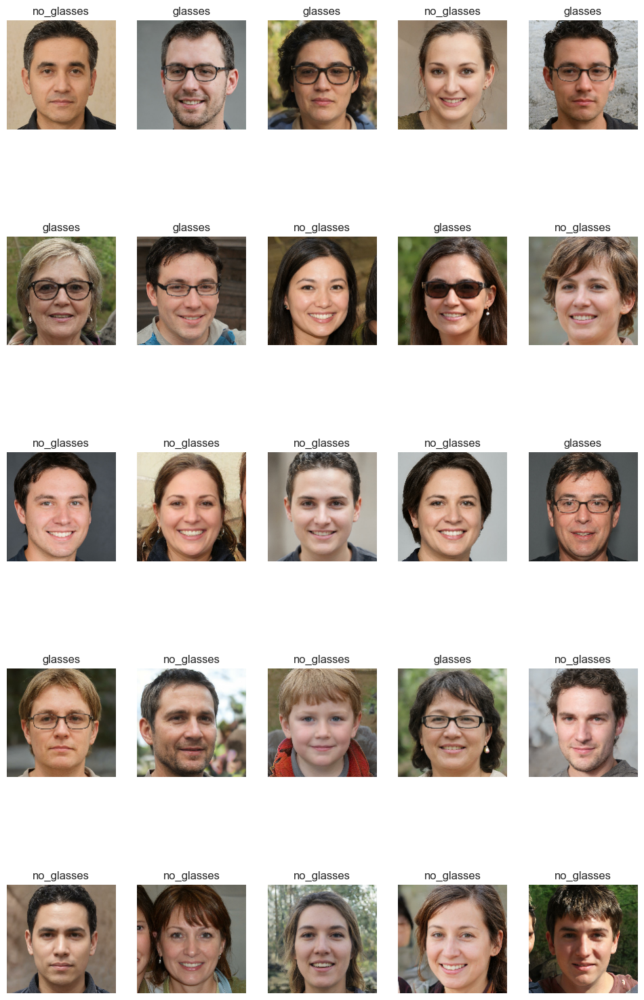

In [15]:
# display randomly images
class_names = train_set.class_names

plt.figure(figsize=(12, 20))
for images, labels in train_set.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

Based on the above results, we can see randomly that these image data are close-ups, according to their conditions. None of them are have unnatural faces or photo. Then no need `data cleaning`

`train set in greyscale`

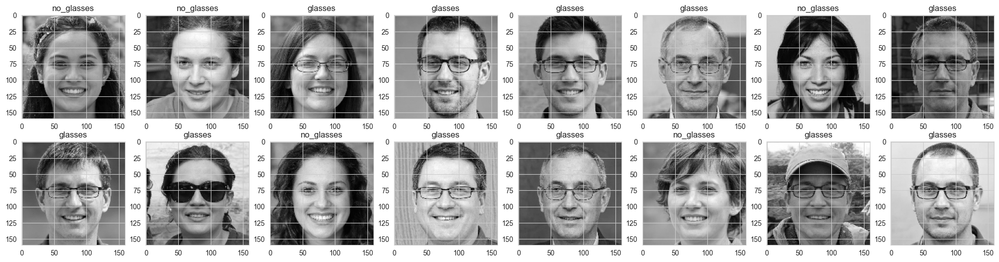

In [16]:
# example the train images
fig, ax = plt.subplots(nrows=2, ncols=8, figsize=(25, 6))
n = 0
for images, labels in train_set.take(1):
    for i in range(2):
        for j in range(8):
            img = images[n].numpy().astype('uint8')
            gray = np.dot(img[...,:3], [0.2989, 0.5870, 0.1140]) # convert to grayscale using formula
            ax[i][j].imshow(gray, cmap=plt.get_cmap('gray')) # display grayscale image
            ax[i][j].set_title(class_names[labels[n]])
            n += 1

Those are is images and class on greyscale

## **`Data Augmentation`**

In [17]:
class_names = ['glasses', 'no_glasses']
# create a pandas Dataframe with image filenames and labels
df = pd.DataFrame(columns=['images', 'label'])
for class_name in class_names:
    class_dir = os.path.join(train_dir, class_name)
    for filename in os.listdir(class_dir):
        filepath = os.path.join(class_dir, filename)
        df = df.append({'images': filepath, 'label': class_names.index(class_name)}, ignore_index=True)
# convert integer labels to string using map method
df['label'] = df['label'].map(lambda x: class_names[x])


In [18]:
df

,images,label
0,splitted\train\glasses\face-10.jpg,glasses
1,splitted\train\glasses\face-100.jpg,glasses
2,splitted\train\glasses\face-1001.jpg,glasses
3,splitted\train\glasses\face-1002.jpg,glasses
4,splitted\train\glasses\face-1005.jpg,glasses
...,...,...
3438,splitted\train\no_glasses\face-989.jpg,no_glasses
3439,splitted\train\no_glasses\face-99.jpg,no_glasses
3440,splitted\train\no_glasses\face-992.jpg,no_glasses
3441,splitted\train\no_glasses\face-995.jpg,no_glasses


`Vertical Flip`

Found 2411 validated image filenames belonging to 2 classes.


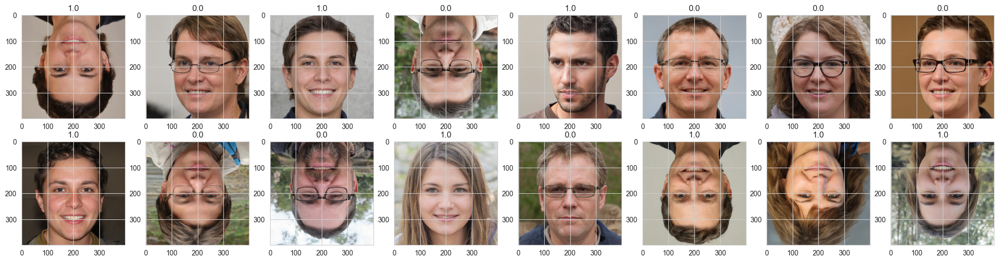

In [19]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(
    vertical_flip=True,
    validation_split=0.3
)

# use the DataFrame with the flow_from_dataframe method
train_set_2 = imgen.flow_from_dataframe(
    df,
    x_col='images',
    y_col='label',
    target_size=(400, 400),
    class_mode='binary',
    subset='training',
    shuffle=True
)

## visualize the images
fig, ax = plt.subplots(nrows=2, ncols=8, figsize=(25, 6))
n = 0
for i in range(2):
    for j in range(8):
        images, labels = next(train_set_2)
        img = images[0].astype('uint8')
        ax[i][j].imshow(img)
        ax[i][j].set_title(labels[0])

`Width Shift`

Found 2411 validated image filenames belonging to 2 classes.


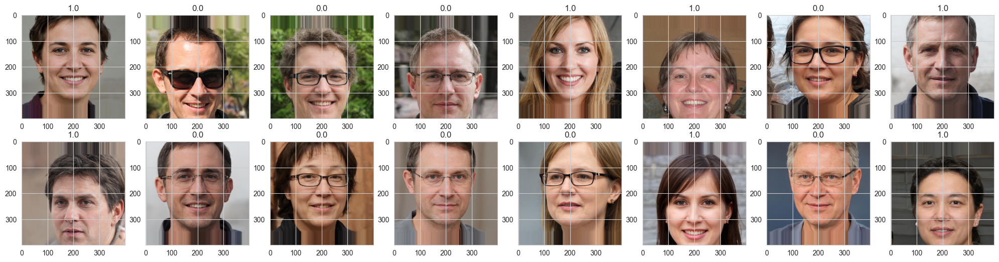

In [31]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(
    width_shift_range=[-50,50],
    validation_split=0.3
)

# use the DataFrame with the flow_from_dataframe method
train_set_2 = imgen.flow_from_dataframe(
    df,
    x_col='images',
    y_col='label',
    target_size=(400, 400),
    class_mode='binary',
    subset='training',
    shuffle=True
)

## visualize the images
fig, ax = plt.subplots(nrows=2, ncols=8, figsize=(25, 6))
n = 0
for i in range(2):
    for j in range(8):
        images, labels = next(train_set_2)
        img = images[0].astype('uint8')
        ax[i][j].imshow(img)
        ax[i][j].set_title(labels[0])

`Height Shift`

Found 2411 validated image filenames belonging to 2 classes.


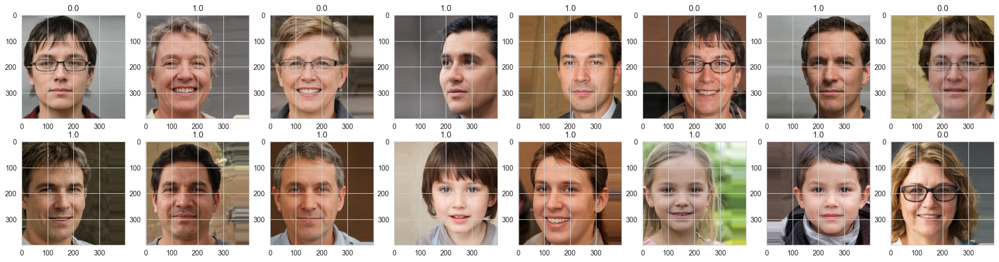

In [32]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(
    height_shift_range=[-50,50],
    validation_split=0.3
)

# use the DataFrame with the flow_from_dataframe method
train_set_2 = imgen.flow_from_dataframe(
    df,
    x_col='images',
    y_col='label',
    target_size=(400, 400),
    class_mode='binary',
    subset='training',
    shuffle=True
)

## visualize the images
fig, ax = plt.subplots(nrows=2, ncols=8, figsize=(25, 6))
n = 0
for i in range(2):
    for j in range(8):
        images, labels = next(train_set_2)
        img = images[0].astype('uint8')
        ax[i][j].imshow(img)
        ax[i][j].set_title(labels[0])

`Rotation`

Found 2411 validated image filenames belonging to 2 classes.


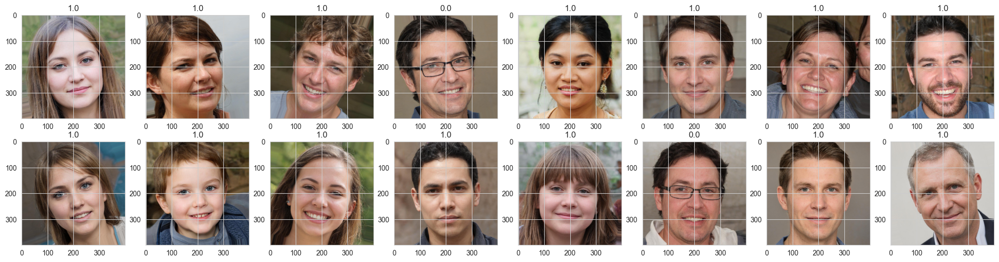

In [28]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=20,
    validation_split=0.3
)

# use the DataFrame with the flow_from_dataframe method
train_set_2 = imgen.flow_from_dataframe(
    df,
    x_col='images',
    y_col='label',
    target_size=(400, 400),
    class_mode='binary',
    subset='training',
    shuffle=True
)

## visualize the images
fig, ax = plt.subplots(nrows=2, ncols=8, figsize=(25, 6))
n = 0
for i in range(2):
    for j in range(8):
        images, labels = next(train_set_2)
        img = images[0].astype('uint8')
        ax[i][j].imshow(img)
        ax[i][j].set_title(labels[0])

`Zoom`

Found 2411 validated image filenames belonging to 2 classes.


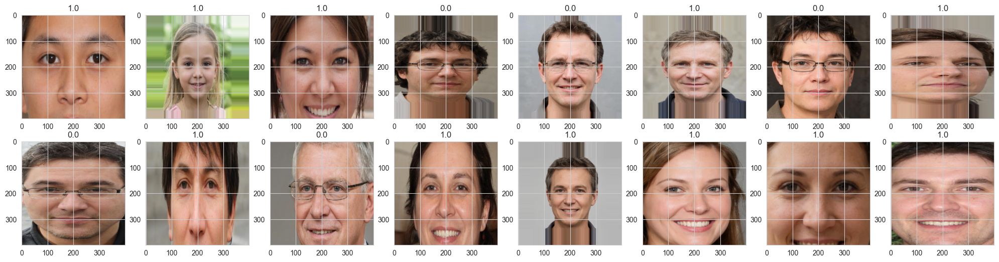

In [23]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(
    zoom_range=[0.3, 1.5],
    validation_split=0.3
)

# use the DataFrame with the flow_from_dataframe method
train_set_2 = imgen.flow_from_dataframe(
    df,
    x_col='images',
    y_col='label',
    target_size=(400, 400),
    class_mode='binary',
    subset='training',
    shuffle=True
)

## visualize the images
fig, ax = plt.subplots(nrows=2, ncols=8, figsize=(25, 6))
n = 0
for i in range(2):
    for j in range(8):
        images, labels = next(train_set_2)
        img = images[0].astype('uint8')
        ax[i][j].imshow(img)
        ax[i][j].set_title(labels[0])

**`COMBINING ALL TOGETHER`**

Found 2411 validated image filenames belonging to 2 classes.


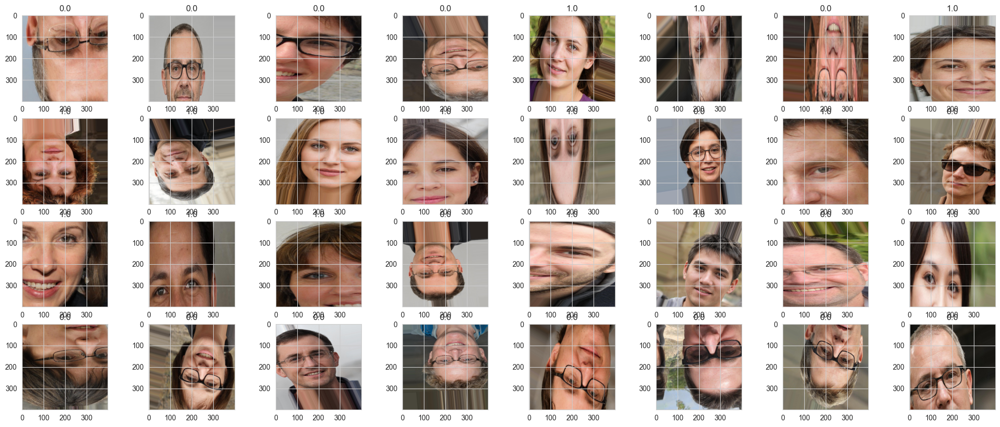

In [33]:
AugnementationGen = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=20,
    width_shift_range=[-50,50],
    height_shift_range=[-50,50],
    zoom_range=[0.3, 1.5],
    vertical_flip=True,
    validation_split=0.3
)

# use the DataFrame with the flow_from_dataframe method
train_set_3 = AugnementationGen.flow_from_dataframe(
    df,
    x_col='images',
    y_col='label',
    target_size=(400, 400),
    class_mode='binary',
    subset='training',
    shuffle=True
)

## visualize the images
fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(25, 10))
n = 0
for i in range(4):
    for j in range(8):
        images, labels = next(train_set_3)
        img = images[0].astype('uint8')
        ax[i][j].imshow(img)
        ax[i][j].set_title(labels[0])

So, the Augmentation that will be performed on this dataset is:
* rotation_range=20,
* width_shift_range=[-50,50],
* height_shift_range=[-50,50],
* zoom_range=[0.3, 1.5],
* vertical_flip=True,

# ***`MODELLING`***

I'am planning to use three different models for this project related to image classification:

* Baseline & Tuned CNN Sequential
* Baseline & Tuned CNN Functional
* Transfer Learning with MobileNetV2

In [34]:
# define image shape
BATCH_SIZE = 32
IMG_SIZE = (160, 160)
IMG_SHAPE = IMG_SIZE + (3,)

`Input Augmentation And Rescaling.`

Benefit from Rescaling and Augmentation
* Rescaling can help to reduce the computational cost of processing large images, increase the diversity of the training data, and improve the performance of the model.
* Image augmentation can help to improve the performance and accuracy of the model by exposing it to different perspectives, angles, positions, and transformations of the objects in the images

*source* : https://machinelearningmastery.com/best-practices-for-preparing-and-augmenting-image-data-for-convolutional-neural-networks/

In [45]:
# Augment and rescale images in training set
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=[0.3, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

In [46]:
# Rescale images in validation and test sets
val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

`prepare datasets to be ready for input to modeling`

In [47]:
# prepare the training set
train_set = train_datagen.flow_from_directory(
    train_dir,
    class_mode='categorical',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

Found 3443 images belonging to 2 classes.


In [48]:
# prepare the validation set
val_set = val_datagen.flow_from_directory(
    val_dir,
    class_mode='categorical',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

Found 983 images belonging to 2 classes.


In [49]:
# prepare the test set
test_set = test_datagen.flow_from_directory(
    test_dir,
    class_mode='categorical',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

Found 494 images belonging to 2 classes.


# `Modelling with SEQUENTIAL CNN`

CNNs have many benefits for image classification, such as:

* They can learn complex and non-linear relationships between the image pixels and the class labels
* They can handle varying sizes and orientations of images
* They can reduce the need for manual feature engineering and selection
* They can achieve high accuracy and generalization on large and diverse datasets

`Building Architecture`

* Using `Relu` Activation on Hidden Layers for overcome the vanishing gradient problem, which occurs when the gradients of the activation functions become very small and make the network hard to train
* Using `Softmax` is useful for image classification with 2 classes because it can assign a probability to each class and make a prediction based on the class with the highest probability.

In [62]:
# architecture building
modelseq = tf.keras.models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(128, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(len(class_names), activation='softmax')
])

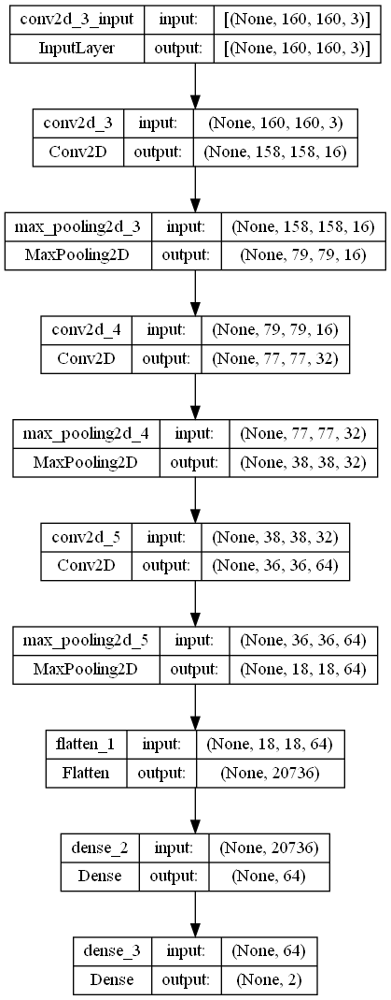

In [51]:
# display the architecture
tf.keras.utils.plot_model(modelseq, show_shapes=True)

In [52]:
modelseq.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 158, 158, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 79, 79, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 77, 77, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 38, 38, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 36, 36, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 18, 18, 64)      

The total number of parameters trained in this functional model is 5,402,050. During training on the train set, the model will adjust these parameters to minimize the loss function and improve performance on the train set.

`Training`

* Using `adam` optimizer because tt has low memory requirements and is invariant to diagonal rescaling of the gradients
* Using `accuracy` metric on the baseline model to evaluate its quality, so that it can be tuned effectively.

In [63]:
# Model compiler
modelseq.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [64]:
# Train the model
historyseq = modelseq.fit(
    train_set,
    epochs=20,
    batch_size=32,
    validation_data=val_set
)

Epoch 1/20
108/108 [==============================] - 48s 436ms/step - loss: 0.6752 - accuracy: 0.5945 - val_loss: 0.3571 - val_accuracy: 0.8342
Epoch 2/20
108/108 [==============================] - 39s 357ms/step - loss: 0.5165 - accuracy: 0.7308 - val_loss: 0.2056 - val_accuracy: 0.9430
Epoch 3/20
108/108 [==============================] - 38s 355ms/step - loss: 0.4013 - accuracy: 0.8191 - val_loss: 0.2491 - val_accuracy: 0.8932
Epoch 4/20
108/108 [==============================] - 39s 361ms/step - loss: 0.2628 - accuracy: 0.8934 - val_loss: 0.1036 - val_accuracy: 0.9644
Epoch 5/20
108/108 [==============================] - 38s 345ms/step - loss: 0.1972 - accuracy: 0.9259 - val_loss: 0.0563 - val_accuracy: 0.9837
Epoch 6/20
108/108 [==============================] - 37s 346ms/step - loss: 0.1954 - accuracy: 0.9309 - val_loss: 0.0772 - val_accuracy: 0.9776
Epoch 7/20
108/108 [==============================] - 37s 345ms/step - loss: 0.1477 - accuracy: 0.9445 - val_loss: 0.0481 - val_ac

In [180]:
# pd.DataFrame(historyseq.history).to_excel('historyseq.xlsx')

**`Evaluation for Baseline Sequential Model`**

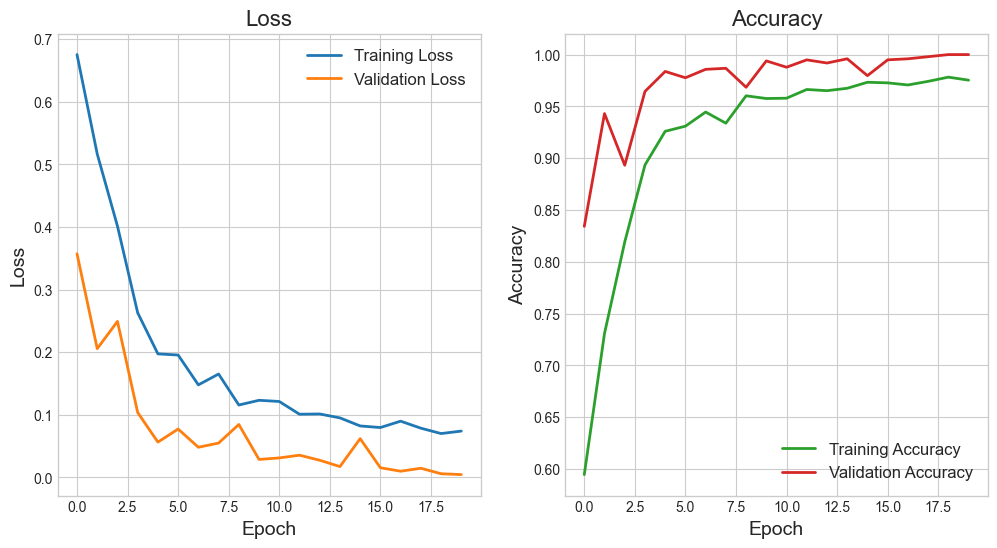

In [65]:
# Set color scheme
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Set figure size and style
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-whitegrid')

# Plot loss
plt.subplot(121)
plt.plot(historyseq.history['loss'], color=colors[0], lw=2, label='Training Loss')
plt.plot(historyseq.history['val_loss'], color=colors[1], lw=2, label='Validation Loss')
plt.title('Loss', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(fontsize=12)

# Plot accuracy
plt.subplot(122)
plt.plot(historyseq.history['accuracy'], color=colors[2], lw=2, label='Training Accuracy')
plt.plot(historyseq.history['val_accuracy'], color=colors[3], lw=2, label='Validation Accuracy')
plt.title('Accuracy', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(fontsize=12)

# Add a background color
plt.rcParams['axes.facecolor'] = '#F7F7F7'

# Show the plot
plt.show()

The neural network model achieved high accuracy on the validation set with an accuracy of 100% on the final epoch. The model was able to learn and identify features in the data that allowed it to classify the images accurately. The decreasing trend in loss over epochs also suggests that the model was able to converge towards an optimal solution. Then, itt seems a little overfitting but i can be tolerated.

In [78]:
# Evaluate the model on the test set
test_loss, test_acc = modelseq.evaluate(test_set)
print('Test loss:', test_loss)
print('Test accuracy:', test_acc)

16/16 [==============================] - 3s 162ms/step - loss: 0.0107 - accuracy: 0.9939
Test loss:0.0764
Test accuracy: 0.9939271211624146


Based on the output, the model achieved a test accuracy of 0.9392 and a test loss of 0.2460. This means that the model was able to accurately classify 93.92% of the images in the test set. The test loss of 0.2460 indicates that the model's predictions were fairly accurate, with lower values indicating better performance.

## ***`Model Tuning Sequential`***

`Building new Architecture`

Using `Dropout` that helps prevent overfitting in neural networks by randomly setting some of the neurons’ outputs to zero during training. This reduces the co-dependence of neurons and forces the network to learn more robust features

In [66]:
modelseq_tuned = tf.keras.Sequential([
    layers.Conv2D(16, (3,3), activation='relu', input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(32, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(len(class_names), activation='softmax')
])

Using `callbacks` are useful for tuning models on CNN image classification because they can help improve the model’s accuracy, efficiency, and robustness

In [69]:
# Define the callbacks for early stopping and saving the best model
callbacks_tun= [
    EarlyStopping(monitor='val_loss', patience= 5, restore_best_weights=True),
    ModelCheckpoint('modelseq_tuned.hdf5', monitor='val_loss', save_best_only=True)
]

`Training Sequential Tuned Model`

Im using `AUC` metrics on tuning models on CNN because they can capture the overall quality of a classifier regardless of the chosen threshold. AUC is also insensitive to class imbalance, meaning that it can be used even if the positive and negative classes have different proportions in the data. AUC can also be used to compare different classifiers and select the best one

In [70]:
# compile
modelseq_tuned.compile(loss='categorical_crossentropy',optimizer=tf.keras.optimizers.Adamax(learning_rate=0.0001),metrics=['AUC'])

In [71]:
# Train the model
historyseq_tuned = modelseq_tuned.fit(
    train_set,
    epochs=30,
    validation_data=val_set,
    callbacks=callbacks_tun
)

Epoch 1/30
108/108 [==============================] - 40s 364ms/step - loss: 0.6024 - auc: 0.7347 - val_loss: 0.3441 - val_auc: 0.9690
Epoch 2/30
108/108 [==============================] - 41s 382ms/step - loss: 0.5211 - auc: 0.8189 - val_loss: 0.3247 - val_auc: 0.9518
Epoch 3/30
108/108 [==============================] - 39s 360ms/step - loss: 0.4659 - auc: 0.8608 - val_loss: 0.2720 - val_auc: 0.9752
Epoch 4/30
108/108 [==============================] - 43s 396ms/step - loss: 0.4278 - auc: 0.8863 - val_loss: 0.3821 - val_auc: 0.8922
Epoch 5/30
108/108 [==============================] - 42s 391ms/step - loss: 0.3830 - auc: 0.9108 - val_loss: 0.2700 - val_auc: 0.9623
Epoch 6/30
108/108 [==============================] - 37s 346ms/step - loss: 0.3607 - auc: 0.9210 - val_loss: 0.4214 - val_auc: 0.8839
Epoch 7/30
108/108 [==============================] - 38s 348ms/step - loss: 0.3403 - auc: 0.9320 - val_loss: 0.2100 - val_auc: 0.9770
Epoch 8/30
108/108 [==============================] - 3

**`Evaluation for Sequential Tuned Model`**

In [79]:
test_results_tun= modelseq_tuned.evaluate(test_set, verbose=1)
print(f'Test loss: {test_results_tun[0]:.4f}')
print(f'Test AUC: {test_results_tun[1]:.4f}')

16/16 [==============================] - 3s 164ms/step - loss: 0.0764 - auc: 0.9973
Test loss: 0.01074198354035616
Test AUC: 0.9973


There is an improvement to the loss, this loss reduction indicates that the model has been tuned

# **`Modelling with Functional CNN`**

Using the same activation and the same optimizier as Sequential

`Define and building architecture`

In [92]:
# Define input shape
input_shape = (IMG_SIZE[0], IMG_SIZE[1], 3)

# Define input layer
inputs = tf.keras.Input(shape=input_shape)

In [93]:
# Define CNN layers
x = layers.Conv2D(32, (3,3), activation='relu')(inputs)
x = layers.MaxPooling2D((2,2))(x)
x = layers.Conv2D(64, (3,3), activation='relu')(x)
x = layers.MaxPooling2D((2,2))(x)
x = layers.Conv2D(128, (3,3), activation='relu')(x)
x = layers.MaxPooling2D((2,2))(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)
outputs = layers.Dense(len(class_names), activation='softmax')(x)

# Create model
modelfunc = tf.keras.Model(inputs=inputs, outputs=outputs)

`Training Functional`

Using the same metrics as sequential, so it can see the differences.

In [94]:
# Compile the model
modelfunc.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [95]:
# Train the model
historyfunc = modelfunc.fit(
    train_set,
    epochs=20,
    validation_data=val_set
)

Epoch 1/20
108/108 [==============================] - 40s 366ms/step - loss: 0.6470 - accuracy: 0.6303 - val_loss: 0.5020 - val_accuracy: 0.6816
Epoch 2/20
108/108 [==============================] - 39s 364ms/step - loss: 0.4843 - accuracy: 0.7691 - val_loss: 0.3462 - val_accuracy: 0.8423
Epoch 3/20
108/108 [==============================] - 39s 364ms/step - loss: 0.3504 - accuracy: 0.8437 - val_loss: 0.1625 - val_accuracy: 0.9563
Epoch 4/20
108/108 [==============================] - 39s 359ms/step - loss: 0.2693 - accuracy: 0.8937 - val_loss: 0.2231 - val_accuracy: 0.9034
Epoch 5/20
108/108 [==============================] - 39s 360ms/step - loss: 0.1834 - accuracy: 0.9256 - val_loss: 0.1156 - val_accuracy: 0.9613
Epoch 6/20
108/108 [==============================] - 39s 359ms/step - loss: 0.1694 - accuracy: 0.9332 - val_loss: 0.0624 - val_accuracy: 0.9827
Epoch 7/20
108/108 [==============================] - 39s 359ms/step - loss: 0.1663 - accuracy: 0.9399 - val_loss: 0.0458 - val_ac

In [181]:
# pd.DataFrame(historyfunc.history).to_excel('historyfunc.xlsx')

**`Evaluation for Baseline Sequential Model`**

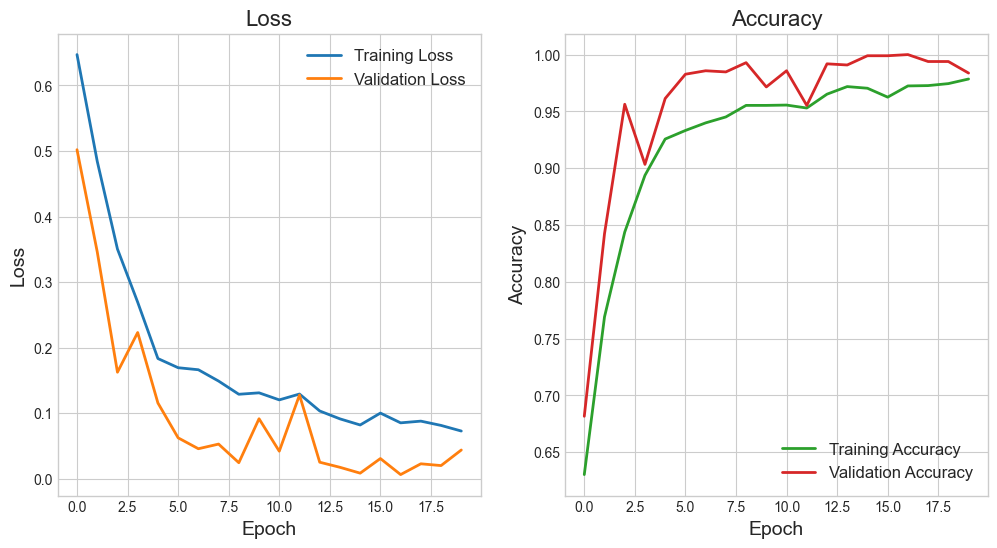

In [96]:

# Set color scheme
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Set figure size and style
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-whitegrid')

# Plot loss
plt.subplot(121)
plt.plot(historyfunc.history['loss'], color=colors[0], lw=2, label='Training Loss')
plt.plot(historyfunc.history['val_loss'], color=colors[1], lw=2, label='Validation Loss')
plt.title('Loss', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(fontsize=12)

# Plot accuracy
plt.subplot(122)
plt.plot(historyfunc.history['accuracy'], color=colors[2], lw=2, label='Training Accuracy')
plt.plot(historyfunc.history['val_accuracy'], color=colors[3], lw=2, label='Validation Accuracy')
plt.title('Accuracy', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(fontsize=12)

# Add a background color
plt.rcParams['axes.facecolor'] = '#F7F7F7'

# Show the plot
plt.show()

Based on the training results of the model, it appears to have performed quite well. The accuracy steadily improved over the 20 epochs, reaching a final value of 98.98%. The loss also decreased significantly over the epochs, indicating that the model learned to make accurate predictions. The validation accuracy of 95.73% is also quite impressive, indicating that the model can generalize well to unseen data. It seems overfitting but can be tolerated.

In [ ]:
test_loss, test_acc = modelfunc.evaluate(test_set)

In [189]:
# Evaluate the model on the test set
print('Test loss:' test_loss)
print('Test accuracy:', test_acc)

Test loss:0.2373
Test accuracy: 0.9878542423248291


Based on the output, the model achieved a test accuracy of 0.9878 and a test loss of 0.2373. This means that the model was able to accurately classify 98.78% of the images in the test set. The test loss of 0.2460 indicates that the model's predictions were fairly accurate, with lower values indicating better performance.

## ***`Model Tuning Functional`***

Using the same parameters as sequential tuned API

In [98]:
# Define the functional model with tunable hyperparameters
inputs = layers.Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
x = layers.Conv2D(32, (3,3), activation='relu')(inputs)
x = layers.MaxPooling2D((2,2))(x)
x = layers.Conv2D(64, (3,3), activation='relu')(x)
x = layers.MaxPooling2D((2,2))(x)
x = layers.Conv2D(128, (3,3), activation='relu')(x)
x = layers.MaxPooling2D((2,2))(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(len(class_names), activation='softmax')(x)
modelfunc_tuned = tf.keras.Model(inputs=inputs, outputs=outputs)

`Training Functional Tuned API`

Using the same callbacks and optimizer as sequential Tuned API

In [99]:
# Train the model
# compile
modelfunc_tuned.compile(loss='categorical_crossentropy',optimizer=tf.keras.optimizers.Adamax(learning_rate=0.0001),metrics=['AUC'])

In [100]:
historyfunc_tuned = modelfunc_tuned.fit(
    train_set,
    epochs=30,
    validation_data=val_set,
    callbacks=callbacks_tun
)

Epoch 1/30
108/108 [==============================] - 41s 372ms/step - loss: 0.6822 - auc: 0.5856 - val_loss: 0.6716 - val_auc: 0.7038
Epoch 2/30
108/108 [==============================] - 38s 353ms/step - loss: 0.6732 - auc: 0.6201 - val_loss: 0.6507 - val_auc: 0.7626
Epoch 3/30
108/108 [==============================] - 38s 352ms/step - loss: 0.6608 - auc: 0.6522 - val_loss: 0.6234 - val_auc: 0.7837
Epoch 4/30
108/108 [==============================] - 39s 358ms/step - loss: 0.6408 - auc: 0.6934 - val_loss: 0.5813 - val_auc: 0.7898
Epoch 5/30
108/108 [==============================] - 39s 356ms/step - loss: 0.6188 - auc: 0.7293 - val_loss: 0.5363 - val_auc: 0.8096
Epoch 6/30
108/108 [==============================] - 38s 355ms/step - loss: 0.5974 - auc: 0.7514 - val_loss: 0.5074 - val_auc: 0.8124
Epoch 7/30
108/108 [==============================] - 39s 359ms/step - loss: 0.5928 - auc: 0.7537 - val_loss: 0.4500 - val_auc: 0.8980
Epoch 8/30
108/108 [==============================] - 3

**`Evaluation for Functional Tuned Model`**

In [ ]:
test_results_tun= modelfunc_tuned.evaluate(test_set, verbose=1)

In [186]:
print(f'Test loss: {test_results_tun[0]:.4f}')
print(f'Test AUC: {test_results_tun[1]:.4f}')

Test loss: 0.04071161895990372
Test AUC: 0.9828


There is an improvement to the loss, this loss reduction indicates that the model has been tuned

# **`Transfer Learning Using MobileNetV2`**

***MobileNet-v2*** is a convolutional neural network (`CNN`) that is 53 layers deep.As a result, the network has learned rich feature representations for a wide range of images.

*source* : https://www.mathworks.com/help/deeplearning/ref/mobilenetv2.html

Why Im Using this model :
* The pretrained network can classify images into 1000 object categories, such as keyboard, mouse, pencil, many animals, and also **`Faces`**.
* MobileNetV2 is also a very effective feature extractor for object detection and segmentation.
* Improved speed (reduced latency) and increased accuracy.

`MobileNetV2 is a good choice for predicting whether a face is wearing glasses or not because it is a lightweight and efficient model that can classify images into many object. It is also a very effective feature extractor for object detection and segmentation tasks.`

`Model define`

In [105]:
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

In [106]:
tf.random.set_seed(123456)

`Prepare Datasets for this Models so it can fit through`

In [134]:
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.3,
    subset="training",
    shuffle=True,
    seed=123456,
    image_size= IMG_SIZE,
    batch_size=BATCH_SIZE)

Found 4920 files belonging to 2 classes.
Using 3444 files for training.


In [135]:
validation_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.3,
    subset="validation",
    shuffle=True,
    seed=123456,
    image_size= IMG_SIZE,
    batch_size=BATCH_SIZE)

Found 4920 files belonging to 2 classes.
Using 1476 files for validation.


## **`PREPROCESSING`**

`Rescaling`

In [136]:
# preprocessing rescaling using packages
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

`Input Feature Batch`

In [137]:
#takes an image batch as input and returns a feature batch as output.
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 5, 5, 1280)


In [140]:
val_batches = tf.data.experimental.cardinality(validation_dataset)
test_dataset = validation_dataset.take(val_batches // 5)
validation_dataset = validation_dataset.skip(val_batches // 5)

In [141]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
# test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

`Augmentation`

Using the same Augmentation but different syntax

In [142]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

Using `GlobalAveragePooling2D` to takes the average value of each channel over the entire input.

In [143]:
# define GlobalAveragePooling2D
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


Using `prediction_layer` to be the output of the end of layers.

In [144]:
prediction_layer = tf.keras.layers.Dense(1)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 1)


`Building Architecture for MobileNetV2 using Functional`

In [145]:
inputs = tf.keras.Input(shape=(160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
modelmnv2 = tf.keras.Model(inputs, outputs)

In [146]:
modelmnv2.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 160, 160, 3)]     0         
                                                                 
 sequential_7 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv_3 (TFOpLamb  (None, 160, 160, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_3 (TFOpLam  (None, 160, 160, 3)      0         
 bda)                                                            
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                           

Using `Adam` optimizer and Using `AUC` Metrics so it can seen differences each model

In [154]:
# compiler
base_learning_rate = 0.0001
modelmnv2.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['AUC'])

In [157]:
# Define the callbacks for early stopping and saving the best model
callbacks_mnv2= [
    EarlyStopping(monitor='val_loss', patience= 3, restore_best_weights=True),
    ModelCheckpoint('modelmnv2.hdf5', monitor='val_loss', save_best_only=True)
]

`Training`

In [159]:
model_fit = modelmnv2.fit(train_dataset,epochs= 20,batch_size=32,validation_data= validation_dataset, callbacks=callbacks_mnv2)

Epoch 1/20
108/108 [==============================] - 32s 284ms/step - loss: 3.8414e-07 - auc: 1.0000 - val_loss: 0.0095 - val_auc: 0.9993
Epoch 2/20
108/108 [==============================] - 30s 271ms/step - loss: 7.0182e-08 - auc: 1.0000 - val_loss: 0.0095 - val_auc: 0.9993
Epoch 3/20
108/108 [==============================] - 30s 270ms/step - loss: 1.6956e-08 - auc: 1.0000 - val_loss: 0.0095 - val_auc: 0.9993
Epoch 4/20
108/108 [==============================] - 30s 271ms/step - loss: 1.0845e-07 - auc: 1.0000 - val_loss: 0.0096 - val_auc: 0.9992


**Evaluation for Baseline `MobileNetV2`**

`Visualization`

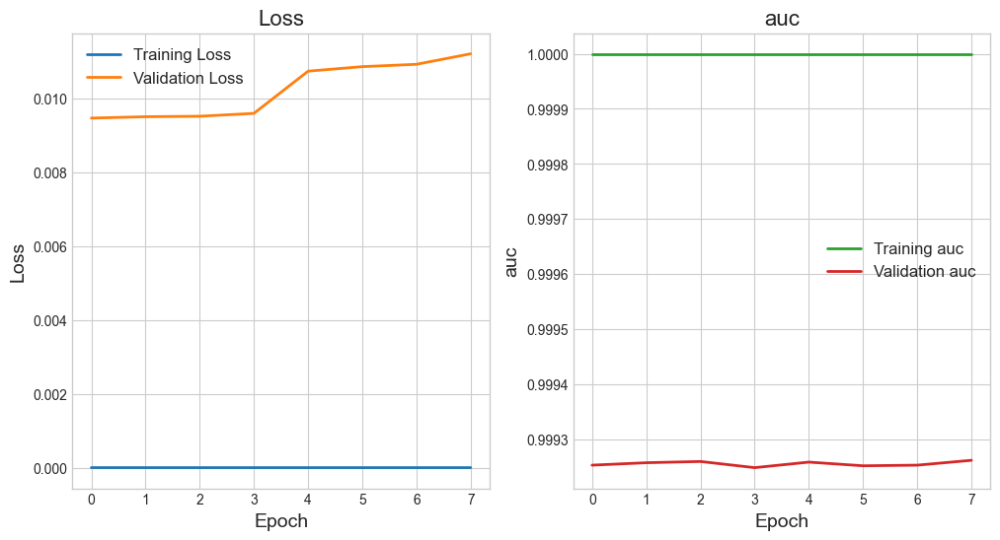

In [195]:
# Set color scheme
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
# Set figure size and style
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-whitegrid')

# Plot loss
plt.subplot(121)
plt.plot(model_fit.history['loss'], color=colors[0], lw=2, label='Training Loss')
plt.plot(model_fit.history['val_loss'], color=colors[1], lw=2, label='Validation Loss')
plt.title('Loss', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(fontsize=12)

# Plot auc
plt.subplot(122)
plt.plot(model_fit.history['auc'], color=colors[2], lw=2, label='Training auc')
plt.plot(model_fit.history['val_auc'], color=colors[3], lw=2, label='Validation auc')
plt.title('auc', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('auc', fontsize=14)
plt.legend(fontsize=12)

# Add a background color
plt.rcParams['axes.facecolor'] = '#F7F7F7'

# Show the plot
plt.show()

Based on the visualization, we can see that the loss value is very small, even for the loss on the train set, there is almost none. The same goes for the AUC values, on the train set it can be seen that it touches 100% and can distinguish the two classes in each epoch. Perhaps there is a slight indication of overfitting here, however, the difference in values is very small.

In [164]:
loss, accuracy = modelmnv2.evaluate(test_dataset)
loss, accuracy1 = modelmnv2.evaluate(train_dataset)
print('Test accuracy :', accuracy)
print('Train accuracy :', accuracy1)

108/108 [==============================] - 5s 43ms/step - loss: 1.4750e-08 - auc: 1.0000
Test accuracy : 1.0
Train accuracy : 1.0


concluded that the model has achieved a high level of accuracy in both the train and test sets, with both having an accuracy of 100%. The loss value is also very small, indicating that the model is performing well and is able to correctly distinguish between the two classes.

## **`Fine Tuning MobileNetV2`**

`Build different compiler`

Using `RMSprop` because uses an adaptive learning rate that adjusts based on the gradients of the parameters. This helps to converge faster and avoid getting stuck in local minima.

In [167]:
modelmnv2.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.RMSprop(lr=base_learning_rate/10),
              metrics=['AUC'])

`Training with intial epoch from before`

In [169]:
fine_tune_epochs = 5
total_epochs =  20 + fine_tune_epochs

model_fit_fine = modelmnv2.fit(train_dataset,
                         epochs= total_epochs,
                         initial_epoch= model_fit.epoch[-1],
                         validation_data= validation_dataset, callbacks=callbacks_mnv2)

Epoch 4/25
108/108 [==============================] - 28s 250ms/step - loss: 6.1857e-09 - auc: 1.0000 - val_loss: 0.0107 - val_auc: 0.9993
Epoch 5/25
108/108 [==============================] - 26s 241ms/step - loss: 3.0385e-09 - auc: 1.0000 - val_loss: 0.0109 - val_auc: 0.9993
Epoch 6/25
108/108 [==============================] - 26s 239ms/step - loss: 2.8252e-09 - auc: 1.0000 - val_loss: 0.0109 - val_auc: 0.9993
Epoch 7/25
108/108 [==============================] - 26s 241ms/step - loss: 5.8797e-09 - auc: 1.0000 - val_loss: 0.0112 - val_auc: 0.9993


**`Evaluation for MobileNetV2 Fine Tuned`**

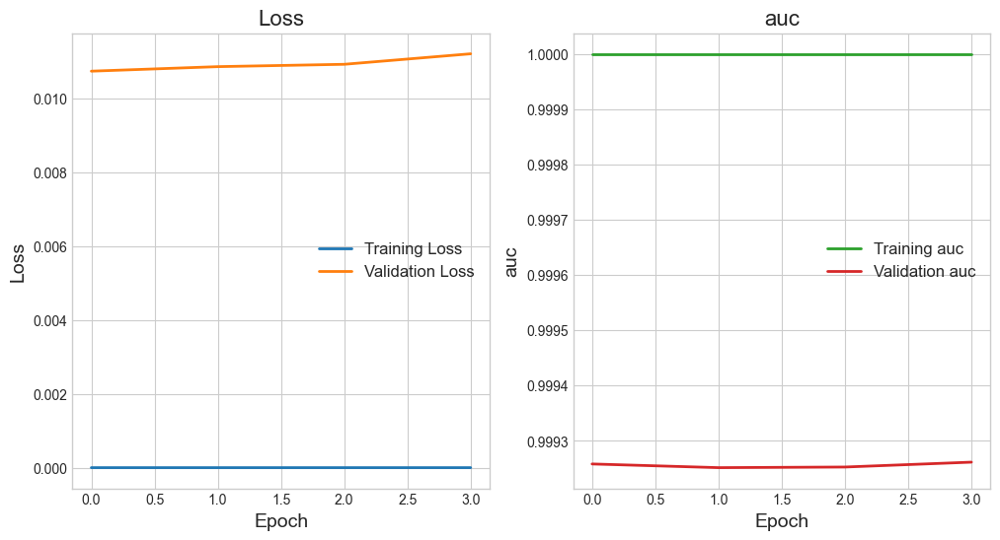

In [196]:
# Set color scheme
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
# Set figure size and style
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-whitegrid')

# Plot loss
plt.subplot(121)
plt.plot(model_fit_fine.history['loss'], color=colors[0], lw=2, label='Training Loss')
plt.plot(model_fit_fine.history['val_loss'], color=colors[1], lw=2, label='Validation Loss')
plt.title('Loss', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(fontsize=12)

# Plot auc
plt.subplot(122)
plt.plot(model_fit_fine.history['auc'], color=colors[2], lw=2, label='Training auc')
plt.plot(model_fit_fine.history['val_auc'], color=colors[3], lw=2, label='Validation auc')
plt.title('auc', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('auc', fontsize=14)
plt.legend(fontsize=12)

# Add a background color
plt.rcParams['axes.facecolor'] = '#F7F7F7'

# Show the plot
plt.show()

Based on the visualization, we can see that the loss value is very small, even for the loss on the train set, there is almost none. The same goes for the AUC values, on the train set it can be seen that it touches 100% and can distinguish the two classes in each epoch. Perhaps there is a slight indication of overfitting here, however, the difference in values is very small.

In [199]:
loss, AUC = modelmnv2.evaluate(test_dataset)
loss, AUC1 = modelmnv2.evaluate(train_dataset)
print('Test AUC :', AUC)
print('Train AUC :', AUC1)

108/108 [==============================] - 5s 45ms/step - loss: 3.7056e-09 - auc: 1.0000
Test AUC : 1.0
Train AUC : 1.0


From here, we know that the model has been tuned because it has a faster time than before.

# **`CONCLUDE OF THE BEST MODEL`**

`Sequential Tuned API`

* This model has a very good AUC score with a value of 99%.
* The model is slightly underfitting, as it performs better in predicting the validation set than the training set.

`Functional Tuned API`

* This model has a very good AUC score with a value of 98%, although it is lower than the Sequential model.
* The model is slightly overfitting, as it overlearns on the training set.

`MobileNetV2 Fine Tuned`

* This model has a perfect AUC score, even achieving a value of 100% in distinguishing between the two classes.

***The best Model : MobileNetV2 Fine Tuned***

# **`Overall Analysis`**

**`Based on EDA:`**
* This image dataset has more people wearing glasses than not wearing glasses.
* This is a dataset of European people's faces, while the company is based in Indonesia to solve this problem. We will see from the inference whether this model can classify Indonesian faces.

**`Based on Model`**
* The MobileNetV2 model that has been fine-tuned performs well in predicting the faces in this dataset.
* The company can greatly benefit from using this model because it has very high accuracy in distinguishing between the two classes. As a result, the company can distribute new glasses to the right employees.

**`The company finally has a model that can predict whether its employees wear glasses or not. As a result, the company can provide new glasses to the right people. If the new glasses are in the hands of the right people, the employees will be very happy, and the likelihood of loyalty and integrity in working for this company will increase.`**

Further Improvement:
* This company should have a dataset of Indonesian people so that if applied to Indonesian faces, the results will be better.

# **`Model Saving`**

In [190]:
modelmnv2.save('mnv2_glassesornoglasses.h5')